<a href="https://colab.research.google.com/github/vad-source/AIMLROBOTICS/blob/main/Understanding%20Environment/State_Action_Space_in_MUJOCO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## AIMLROBOTICS
**Designed by:** RAJA VADHANA PRABHAKAR  
**Organization:** BITS PILANI WILP  
**Purpose:** Academic Training / Proof of Concept  

---
#### Attribution & AI Disclosure
- **Original Design:** The logic, architecture, and modular structure of this notebook were designed by the author.
- **Development Assistance:** Generative AI (e.g., ChatGPT/Claude/Copilot) was used for coding implementation and debugging support.
- **License:** This work is licensed under the [Apache License 2.0](https://apache.org).

**Objective:**
>> To familiarize with the state and action space in MUJOCO environment

>> To familiarize witht the data collection approach from the engine for creating traning data

# Install packages

In [ ]:
# System packages for headless rendering
!apt-get -y install libgl1-mesa-dev libglfw3

# Core libraries
!pip install -U gymnasium[mujoco] mujoco numpy torch scikit-learn matplotlib stable-baselines3 "shimmy>=2.0"

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libegl-dev libgl-dev libgles-dev libgles1 libglvnd-core-dev libglvnd-dev
  libglx-dev libopengl-dev
Suggested packages:
  libosmesa6 libvulkan1
The following NEW packages will be installed:
  libegl-dev libgl-dev libgl1-mesa-dev libgles-dev libgles1 libglfw3
  libglvnd-core-dev libglvnd-dev libglx-dev libopengl-dev
0 upgraded, 10 newly installed, 0 to remove and 41 not upgraded.
Need to get 304 kB of archives.
After this operation, 2,890 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libglx-dev amd64 1.4.0-1 [14.1 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgl-dev amd64 1.4.0-1 [101 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libegl-dev amd64 1.4.0-1 [18.0 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgles1 amd64 1.4.0-1 [11.5 kB]
Get:

## Lib

In [ ]:
import os, random, time, math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv

# Ensure reproducibility
np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


# Environment Setup

In [ ]:
# Helper to make env with rgb rendering
def make_env(env_id):
    return gym.make(env_id, render_mode="rgb_array")

ENV_IDS = ["HalfCheetah-v5", "Hopper-v5", "Ant-v5", "Humanoid-v5"]

## To view install lib (one time)

In [ ]:
!apt-get install -y xvfb ffmpeg
!pip install gymnasium[mujoco] pyvirtualdisplay imageio

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.16).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


#### Set Up disaply

In [ ]:
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
import imageio

#### Function to visualize frames

In [ ]:
def visualize_transition(env_id, steps=50, seed=0):
    env = gym.make(env_id, render_mode="rgb_array")
    obs, info = env.reset(seed=seed)
    frames = []

    for t in range(steps):
        action = env.action_space.sample()
        next_obs, reward, term, trunc, info = env.step(action)

        # Render frame
        frame = env.render()

        # Overlay text (state[0], action[0], next_state[0])
        import cv2
        frame = np.ascontiguousarray(frame)  # make sure memory layout is C-contiguous
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)  # convert to BGR for OpenCV

        text = f"s[0]={obs[0]:.2f}, a[0]={action[0]:.2f}, s'[0]={next_obs[0]:.2f}"
        frame_bgr = cv2.putText(frame_bgr, text, (10,30),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,0,0), 2, cv2.LINE_AA)

        #text = f"s[0]={obs[0]:.2f}, a[0]={action[0]:.2f}, s'[0]={next_obs[0]:.2f}"
        #frame = cv2.putText(frame, text, (10,30), cv2.FONT_HERSHEY_SIMPLEX,
        #                    0.8, (255,0,0), 2, cv2.LINE_AA)

        frames.append(frame)
        obs = next_obs
        if term or trunc:
            obs, info = env.reset()

    env.close()
    return frames

## Show sample Env

Bot : Cheetah
State Space : 17
Action Space : 6


/usr/local/lib/python3.12/dist-packages/imageio/plugins/pillow.py:409: DeprecationWarning: The keyword `fps` is no longer supported. Use `duration`(in ms) instead, e.g. `fps=50` == `duration=20` (1000 * 1/50).
  warnings.warn(


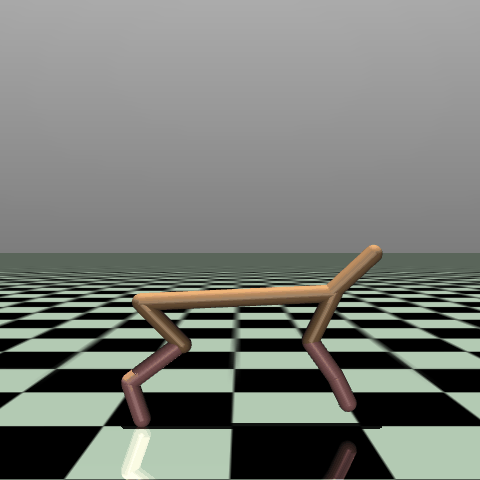

In [ ]:
frames = visualize_transition("HalfCheetah-v5", steps=100)

# Save as GIF
imageio.mimsave("halfcheetah.gif", frames, fps=20)

# Display inline
from IPython.display import Image
Image(filename="halfcheetah.gif")

Bot : Hopper
State Space : 11
Action Space : 3

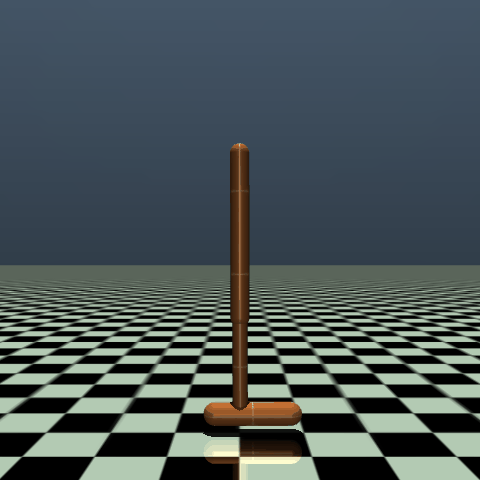

In [ ]:
frames = visualize_transition("Hopper-v5", steps=100)

# Save as GIF
imageio.mimsave("Hopper-v5.gif", frames, fps=20)

# Display inline
from IPython.display import Image
Image(filename="Hopper-v5.gif")

Bot : Ant
State Space : 105
Action Space : 8

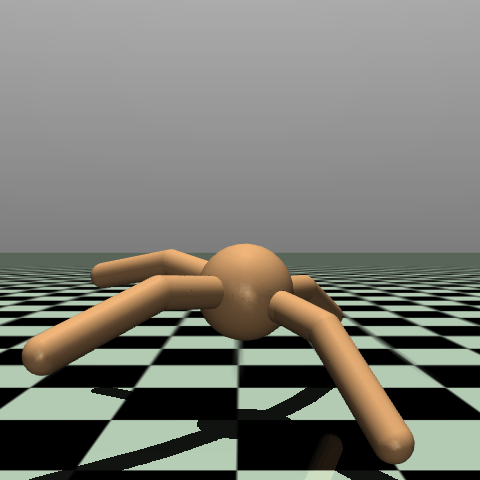

In [ ]:
frames = visualize_transition("Ant-v5", steps=100)

# Save as GIF
imageio.mimsave("Ant-v5.gif", frames, fps=20)

# Display inline
from IPython.display import Image
Image(filename="Ant-v5.gif")

Bot : Humanoid
State Space : 348
Action Space : 17

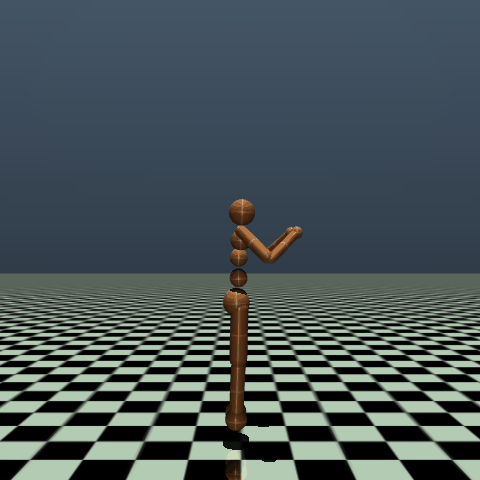

In [ ]:
frames = visualize_transition("Humanoid-v5", steps=100)

# Save as GIF
imageio.mimsave("Humanoid-v5.gif", frames, fps=20)

# Display inline
from IPython.display import Image
Image(filename="Humanoid-v5.gif")

# Build Datasets (or import)
Y(Target) = f(St+1, St) = Delta(S)

In [ ]:
def collect_dataset(env_id, steps=3000):
    env = make_env(env_id)
    obs, info = env.reset(seed=42)
    X, Y = [], []  # Inputs: [s, a]; Targets: Δs

    for _ in range(steps):
        a = env.action_space.sample()
        s = obs.copy()
        obs, reward, terminated, truncated, info = env.step(a)
        s_next = obs.copy()
        delta = s_next - s
        X.append(np.concatenate([s, a], axis=0))
        Y.append(delta)
        if terminated or truncated:
            obs, info = env.reset()
    env.close()
    X = np.asarray(X, dtype=np.float32)
    Y = np.asarray(Y, dtype=np.float32)
    return X, Y

datasets = {}
for env_id in ENV_IDS:
    print(f"Collecting dataset for {env_id}...")
    X, Y = collect_dataset(env_id, steps=2000)  # keep small for speed
    datasets[env_id] = (X, Y)
    print(f"{env_id}: X={X.shape}, Y={Y.shape}")

HalfCheetah-v5: X=(2000, 23), Y=(2000, 17)
Hopper-v5: X=(2000, 14), Y=(2000, 11)
Ant-v5: X=(2000, 113), Y=(2000, 105)
Humanoid-v5: X=(2000, 365), Y=(2000, 348)


In [ ]:
datasets["Humanoid-v5"]

(array([[ 1.407172  ,  1.0039474 , -0.00811645, ...,  0.29214233,
         -0.2128691 ,  0.00406397],
        [ 1.4059489 ,  0.9998555 , -0.00726226, ...,  0.23987003,
         -0.31081352, -0.3749832 ],
        [ 1.4019281 ,  0.9995635 , -0.00432756, ...,  0.09113282,
          0.30550513,  0.03145678],
        ...,
        [ 1.3741921 ,  0.99983793, -0.01046802, ...,  0.06579556,
          0.18916109, -0.1636195 ],
        [ 1.3642583 ,  0.99997646, -0.00584081, ...,  0.28416818,
         -0.2166378 ,  0.35104376],
        [ 1.3507106 ,  0.99997157, -0.00546204, ...,  0.12611488,
          0.1276737 , -0.14845638]], shape=(2000, 365), dtype=float32),
 array([[-1.2231388e-03, -4.0918486e-03,  8.5418933e-04, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-4.0206984e-03, -2.9202207e-04,  2.9347038e-03, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-6.4479108e-03,  9.1232192e-05,  2.0508773e-03, ...,
          0.0000000e+00,  0.0000000e+

# MOTION MODELS (with simulated data)

## Linear Regression
Δ
𝑠
≈
𝑊
⋅
[
𝑠
,
𝑎
]
+
𝑏

X = (S, a), Y = ΔS

Linear model trained for HalfCheetah-v5
Linear model trained for Hopper-v5
Linear model trained for Ant-v5
Linear model trained for Humanoid-v5


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


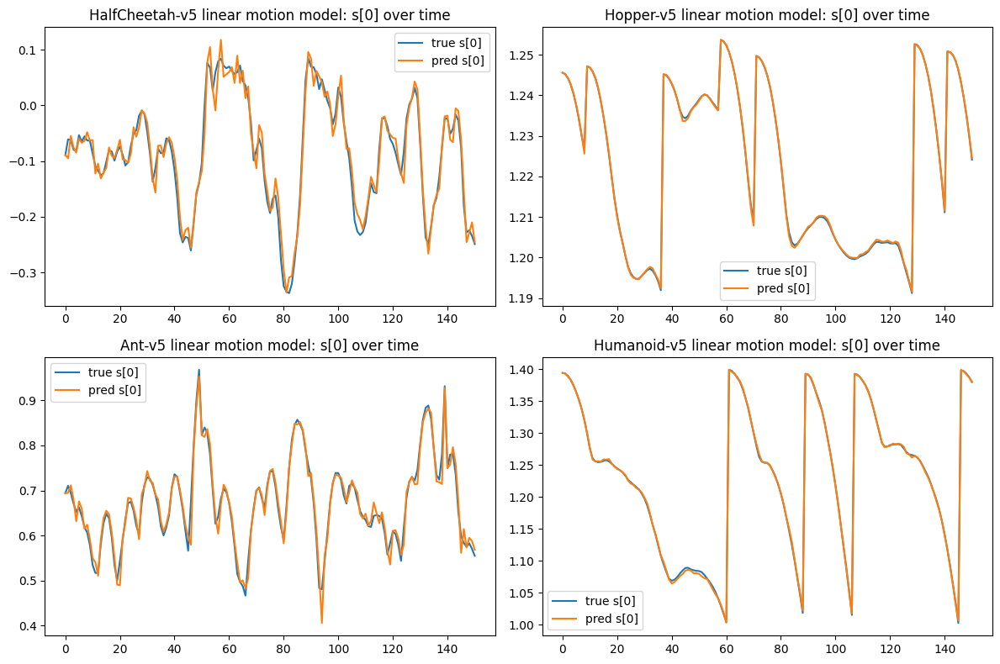

In [ ]:
def train_linear_motion_model(X, Y):
    model = LinearRegression()
    model.fit(X, Y)
    return model

def rollout_predicted_motion(env_id, model, horizon=100):
    env = make_env(env_id)
    s, info = env.reset(seed=123)
    states_true, states_pred = [s.copy()], [s.copy()]
    for t in range(horizon):
        a = env.action_space.sample()  # random action for fair comparison
        s_true = states_true[-1]
        # True step
        obs, reward, term, trunc, info = env.step(a)
        s_next_true = obs.copy()
        states_true.append(s_next_true)
        # Predicted step
        x = np.concatenate([s_true, a], axis=0).astype(np.float32).reshape(1, -1)
        delta_pred = model.predict(x)[0]
        s_next_pred = s_true + delta_pred
        states_pred.append(s_next_pred)
        if term or trunc:
            s, info = env.reset()
            states_true[-1] = s.copy()
            states_pred[-1] = s.copy()
    env.close()
    return np.array(states_true), np.array(states_pred)

lin_models = {}
for env_id in ENV_IDS:
    X, Y = datasets[env_id]
    lin_models[env_id] = train_linear_motion_model(X, Y)
    print(f"Linear model trained for {env_id}")

# Visualize one dimension (e.g., first state component) for each env
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()
for i, env_id in enumerate(ENV_IDS):
    s_true, s_pred = rollout_predicted_motion(env_id, lin_models[env_id], horizon=150)
    axs[i].plot(s_true[:,0], label="true s[0]")
    axs[i].plot(s_pred[:,0], label="pred s[0]")
    axs[i].set_title(f"{env_id} linear motion model: s[0] over time")
    axs[i].legend()
plt.tight_layout()
plt.show()

## DNN

### DNN Model Design & Train

In [ ]:
class MLP(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, 128), nn.ReLU(),
            nn.Linear(128, 128), nn.ReLU(),
            nn.Linear(128, out_dim)
        )
    def forward(self, x): return self.net(x)

def train_mlp_motion_model(X, Y, epochs=10, lr=1e-3, batch=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    X_t = torch.tensor(X, dtype=torch.float32).to(device)
    Y_t = torch.tensor(Y, dtype=torch.float32).to(device)
    model = MLP(X.shape[1], Y.shape[1]).to(device)
    opt = optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    for ep in range(epochs):
        perm = torch.randperm(X_t.size(0))
        for i in range(0, X_t.size(0), batch):
            idx = perm[i:i+batch]
            xb, yb = X_t[idx], Y_t[idx]
            pred = model(xb)
            loss = loss_fn(pred, yb)
            opt.zero_grad(); loss.backward(); opt.step()
        if ep % 2 == 0:
            print(f"Epoch {ep}: loss={loss.item():.5f}")
    return model

### DNN Model Evaluation : DNN vs InbuiltTrue Value

In [ ]:
def rollout_predicted_motion_dl(env_id, model, horizon=100):
    device = next(model.parameters()).device
    env = make_env(env_id)
    s, info = env.reset(seed=321)
    states_true, states_pred = [s.copy()], [s.copy()]
    for _ in range(horizon):
        a = env.action_space.sample()
        s_true = states_true[-1]
        # True step
        obs, reward, term, trunc, info = env.step(a)
        s_next_true = obs.copy()
        states_true.append(s_next_true)
        # Predicted step
        x = np.concatenate([s_true, a], axis=0).astype(np.float32)[None, :]
        with torch.no_grad():
            delta_pred = model(torch.tensor(x, device=device)).cpu().numpy()[0]
        s_next_pred = s_true + delta_pred
        states_pred.append(s_next_pred)
        if term or trunc:
            s, info = env.reset()
            states_true[-1] = s.copy()
            states_pred[-1] = s.copy()
    env.close()
    return np.array(states_true), np.array(states_pred)

### Plot the results

Training MLP motion model for HalfCheetah-v5...
Epoch 0: loss=32.93713
Epoch 2: loss=22.68641
Epoch 4: loss=15.11818
Epoch 6: loss=13.99036
MLP trained for HalfCheetah-v5
Training MLP motion model for Hopper-v5...
Epoch 0: loss=0.20877
Epoch 2: loss=0.12332
Epoch 4: loss=0.03978
Epoch 6: loss=0.03611
MLP trained for Hopper-v5
Training MLP motion model for Ant-v5...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Epoch 0: loss=1.95295
Epoch 2: loss=1.61500
Epoch 4: loss=1.31706
Epoch 6: loss=1.32250
MLP trained for Ant-v5
Training MLP motion model for Humanoid-v5...
Epoch 0: loss=1182.41248
Epoch 2: loss=1014.52246
Epoch 4: loss=661.38428
Epoch 6: loss=1214.32898
MLP trained for Humanoid-v5


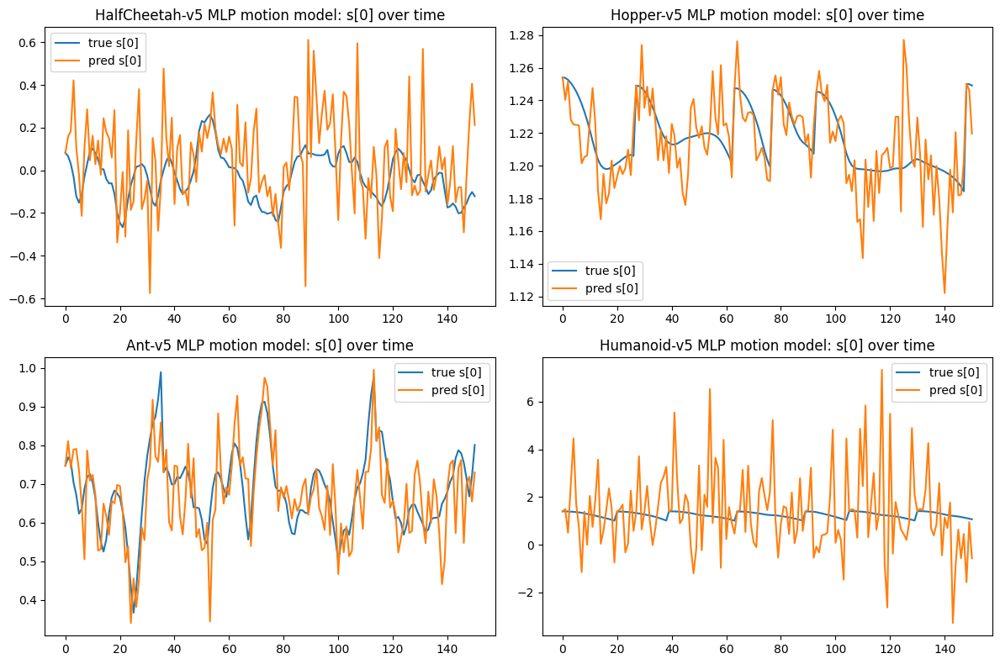

In [ ]:
dl_models = {}
for env_id in ENV_IDS:
    X, Y = datasets[env_id]
    print(f"Training MLP motion model for {env_id}...")
    dl_models[env_id] = train_mlp_motion_model(X, Y, epochs=8)  # short training
    print(f"MLP trained for {env_id}")

# Visualize first dimension for DL model
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()
for i, env_id in enumerate(ENV_IDS):
    s_true, s_pred = rollout_predicted_motion_dl(env_id, dl_models[env_id], horizon=150)
    axs[i].plot(s_true[:,0], label="true s[0]")
    axs[i].plot(s_pred[:,0], label="pred s[0]")
    axs[i].set_title(f"{env_id} MLP motion model: s[0] over time")
    axs[i].legend()
plt.tight_layout()
plt.show()

## DRL

### DRL Model setup

In [ ]:
def train_ppo(env_id, timesteps=5000):
    def make():
        return make_env(env_id)
    vec_env = DummyVecEnv([make])
    model = PPO("MlpPolicy", vec_env, verbose=0)
    model.learn(total_timesteps=timesteps)
    return model, vec_env

### DRL Training

In [ ]:
def rollout_policy(env_id, model, horizon=200):
    env = make_env(env_id)
    s, info = env.reset(seed=999)
    states = [s.copy()]
    for _ in range(horizon):
        a, _ = model.predict(s, deterministic=True)
        s, r, term, trunc, info = env.step(a)
        states.append(s.copy())
        if term or trunc:
            s, info = env.reset()
            states[-1] = s.copy()
    env.close()
    return np.array(states)

ppo_models = {}
for env_id in ENV_IDS:
    print(f"Training PPO on {env_id} (short run)...")
    model, vec_env = train_ppo(env_id, timesteps=4000)  # keep short
    ppo_models[env_id] = model
    vec_env.close()
    print(f"PPO trained for {env_id}")

Training PPO on HalfCheetah-v5 (short run)...


/usr/local/lib/python3.12/dist-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


PPO trained for HalfCheetah-v5
Training PPO on Hopper-v5 (short run)...
PPO trained for Hopper-v5
Training PPO on Ant-v5 (short run)...
PPO trained for Ant-v5
Training PPO on Humanoid-v5 (short run)...
PPO trained for Humanoid-v5


### # Visualize policy motion (first state component)

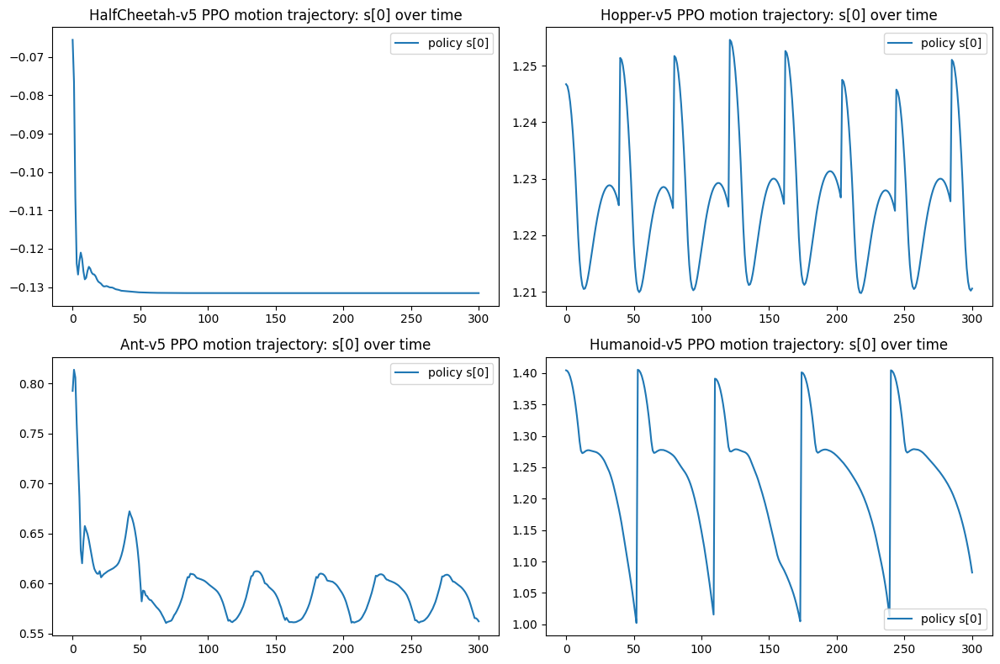

In [ ]:

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()
for i, env_id in enumerate(ENV_IDS):
    states = rollout_policy(env_id, ppo_models[env_id], horizon=300)
    axs[i].plot(states[:,0], label="policy s[0]")
    axs[i].set_title(f"{env_id} PPO motion trajectory: s[0] over time")
    axs[i].legend()
plt.tight_layout()
plt.show()